## Vision Transformer (ViT)

### Trabajo Práctico N° 1

### Christopher Charaf

## Tareas:

1. **Modificar los parametros:** Cambiar el tamaño de los parches, y la cantidad de dimensiones del embedding. Investigar y describir las ventajas y desventajas de tener más o menos parches/dimensiones.

2. **Implementar embedding posicional aprendido 1D:** Partiendo de ejemplo proporcionado (codificación sinusoidal en clase PositionalEncoding), implementar una clase PositionalEncodingLearned que utilice PyTorch y genere embebidos posicionales aprendidos. Graficar. 

### Imports

In [16]:
import torch
from torch import Tensor
import torch.nn as nn
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image
import math
import time
import pandas as pd
import numpy as np
from contextlib import contextmanager

### Declaracion de funciones/clases   

In [17]:
# La configuración, carga y preprocesamiento
class ConfigPreprocess:
    def __init__(self, img_path: str, img_size: int, patch_size: int):
        self.device = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'
        print(f'Dispositivo utilizado: {self.device}')
        
        self.img_path = img_path
        self.img_size = img_size
        self.patch_size = patch_size
        self.test_img = self.load_image()

    def load_image(self):
        return TF.to_tensor(Image.open(self.img_path).resize((self.img_size, self.img_size))).unsqueeze(0).to(self.device)

    def extract_patches(self, image: Tensor) -> Tensor:
        patches = image.unfold(1, self.patch_size, self.patch_size).unfold(2, self.patch_size, self.patch_size)
        patches = patches.contiguous().view(image.shape[0], -1, self.patch_size, self.patch_size)
        return patches
    

class PatchEmbedding(nn.Module):
    def __init__(self, img_size: int, patch_size: int, in_channels: int = 3, embed_dim: int = 8):
        super(PatchEmbedding, self).__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.num_patches = (img_size // patch_size) ** 2
        self.proj = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)  # (B, embed_dim, H/patch_size, W/patch_size)
        x = x.flatten(2)  # (B, embed_dim, num_patches)
        x = x.transpose(1, 2)  # (B, num_patches, embed_dim)
        return x

class PositionalEncoding(nn.Module):
    def __init__(self, num_patches, embed_dim):
        super(PositionalEncoding, self).__init__()
        self.register_buffer('pos_embedding', self.create_positional_encoding(num_patches, embed_dim))

    def create_positional_encoding(self, num_patches, embed_dim):
        position = torch.arange(num_patches, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, embed_dim, 2).float() * -(math.log(10000.0) / embed_dim))
        pos_encoding = torch.zeros(num_patches, embed_dim)
        pos_encoding[:, 0::2] = torch.sin(position * div_term)  # Aplicar seno en dimensiones pares
        pos_encoding[:, 1::2] = torch.cos(position * div_term)  # Aplicar coseno en dimensiones impares
        return pos_encoding.unsqueeze(0)  # Añadir dimensión de batch

    def forward(self, x):
        return x + self.pos_embedding

class Visualization:
    @staticmethod  # No requiere self
    def visualize_patches(patches: Tensor):
        num_patches = patches.shape[1]
        num_cols = int(num_patches ** 0.5)
        num_rows = (num_patches + num_cols - 1) // num_cols
        _, axs = plt.subplots(num_rows, num_cols, figsize=(4, 4))
        for i in range(num_rows):
            for j in range(num_cols):
                idx = i * num_cols + j
                if idx < num_patches:
                    patch = patches[:, idx]
                    num_channels = patch.shape[0]
                    if num_channels == 1:
                        axs[i, j].imshow(patch.squeeze().detach().cpu().numpy(), cmap='gray')
                    elif num_channels == 3:
                        axs[i, j].imshow(patch.permute(1, 2, 0).detach().cpu().numpy())
                    axs[i, j].axis('off')
                else:
                    axs[i, j].axis('off')
        plt.tight_layout(pad=0.15)
        plt.show()

    @staticmethod  # No requiere self
    def visualize_positional_encoding(pos_embeddings: Tensor):
        plt.figure(figsize=(14, 4))
        plt.title('Codificaciones Posicionales para los Parches', fontsize=16, weight='bold')
        for i in range(pos_embeddings.shape[2]):
            plt.plot(pos_embeddings[0, :, i].detach().cpu().numpy(), label=f'Dimensión {i + 1}')
        plt.xlabel('Índice del Parche', fontsize=14)
        plt.ylabel('Valor de la Codificación Posicional', fontsize=14)
        plt.legend()
        plt.grid()
        plt.show()

    @staticmethod
    def visualize_single_patch_encoding(pos_embeddings: Tensor, patch_idx: int):
        num_patches = pos_embeddings.shape[1]
        if patch_idx < 0 or patch_idx >= num_patches:
            raise ValueError(f"El índice del parche debe estar entre 0 y {num_patches - 1}, pero se recibió {patch_idx}.")
        patch_encoding = pos_embeddings[0, patch_idx, :].detach().cpu().numpy()
        plt.figure(figsize=(14, 4))
        plt.plot(patch_encoding, marker='o', label=f'Parche {patch_idx + 1}')
        plt.title(f'Encoding Posicional para el Parche {patch_idx + 1}', fontsize=16, weight='bold')
        plt.xlabel('Dimensión del Embedding', fontsize=14)
        plt.ylabel('Valor del Encoding', fontsize=14)
        plt.grid()
        plt.legend()
        plt.show()

In [18]:
# Clase para la codificación posicional aprendida para punto 2  
class PositionalEncodingLearned(nn.Module):
    """
    Positional embedding aprendido para los parches de imagen.
    Este módulo añade embeddings posicionales aprendidos a los embeddings de entrada.
    """
    def __init__(self, num_patches, embed_dim, dropout=0.1):
        super(PositionalEncodingLearned, self).__init__()
        self.pos_embedding = nn.Parameter(torch.zeros(1, num_patches, embed_dim))
        
        self._reset_parameters()
        
        # Dropout después de sumar los embeddings posicionales
        self.dropout = nn.Dropout(p=dropout)
    
    def _reset_parameters(self):
        """Inicializa los parámetros de embedding posicional"""
        nn.init.normal_(self.pos_embedding, std=0.02)
    
    def forward(self, x):
        """
        Agrega los embeddings aprendidos a los de entrada.
        
        Args:
            x: Tensor de embeddings de entrada [batch_size, num_patches, embed_dim]
        
        Returns:
            x: Tensor con embeddings posicionales añadidos [batch_size, num_patches, embed_dim]
        """
        x = x + self.pos_embedding
        return self.dropout(x)

In [19]:
# Selecciona el tipo de encoding posicional
def create_positional_encoding(encoding_type, num_patches, embed_dim, dropout=0.1):
    """
    Crea un módulo de encoding posicional según el tipo.
    
    Args:
        encoding_type: 'sinusoidal' o 'learned'
        num_patches: Número de parches
        embed_dim: Dimensión del embedding
        dropout: Dropout (solo para 'learned')
    
    Returns:
        Módulo de encoding posicional
    """
    if encoding_type.lower() == 'sinusoidal':
        return PositionalEncoding(num_patches, embed_dim)
    elif encoding_type.lower() == 'learned':
        return PositionalEncodingLearned(num_patches, embed_dim, dropout)
    else:
        raise ValueError(f"Tipo de encoding posicional no reconocido: {encoding_type}. "
                        f"Debe ser 'sinusoidal' o 'learned'.")

# Ejecuta el modelo ViT con sinusoidal como default y muestra resultados
def run_vit(img_path, img_size, patch_size, embed_dim, 
                              pos_encoding_type='sinusoidal', visualizar=False):
    tiempos = {}
    
    # Medir Preprocesamiento
    inicio = time.time()
    config = ConfigPreprocess(img_path, img_size, patch_size)
    fin = time.time()
    tiempos['preprocesamiento'] = fin - inicio
    
    # Medir parches
    inicio = time.time()
    patches = config.extract_patches(config.test_img.squeeze(0))
    if visualizar:
        Visualization.visualize_patches(patches)
    fin = time.time()
    tiempos['extraccion_parches'] = fin - inicio
    
    # Medir Embeddings
    inicio = time.time()
    embedded_patches = PatchEmbedding(img_size, patch_size, 3, embed_dim).to(config.device)
    patches = embedded_patches(config.test_img)    
    fin = time.time()
    tiempos['generacion_embeddings'] = fin - inicio
    
    # Medir encodings posicionales
    inicio = time.time()
    num_patches = (img_size // patch_size) ** 2
    positional_encoding = create_positional_encoding(pos_encoding_type, num_patches, embed_dim).to(config.device)
    pos_embeddings = positional_encoding(patches)
    fin = time.time()
    tiempos['codificacion_posicional'] = fin - inicio
    
    tiempos['pos_encoding_type'] = pos_encoding_type
    
    # Visualización opcional
    if visualizar:
        inicio = time.time()
        Visualization.visualize_positional_encoding(pos_embeddings)
        Visualization.visualize_single_patch_encoding(pos_embeddings, 0)
        fin = time.time()
        tiempos['visualizacion'] = fin - inicio
    
    # Datos adicionales para análisis
    tiempos['patch_size'] = patch_size
    tiempos['embed_dim'] = embed_dim
    tiempos['num_patches'] = num_patches
    tiempos["total"] = sum(
        v
        for k, v in tiempos.items()
        if isinstance(v, (int, float))
        and k not in ["patch_size", "embed_dim", "num_patches", "pos_encoding_type"]
    )
    
    # Estimación de memoria (MB)
    memoria_patches = (num_patches * 3 * patch_size * patch_size * 4) / (1024 * 1024)
    memoria_embeddings = (num_patches * embed_dim * 4) / (1024 * 1024)
    memoria_pos_encoding = 0
    if pos_encoding_type.lower() == 'learned':
        memoria_pos_encoding = (num_patches * embed_dim * 4) / (1024 * 1024)
    
    tiempos['memoria_patches_mb'] = memoria_patches
    tiempos['memoria_embeddings_mb'] = memoria_embeddings
    tiempos['memoria_pos_encoding_mb'] = memoria_pos_encoding
    tiempos['memoria_total_mb'] = memoria_patches + memoria_embeddings + memoria_pos_encoding
    
    return tiempos, pos_embeddings

In [20]:
# Funcion para comparar visualmente los encodings  
def compare_positional_encodings(img_path, img_size, patch_size, embed_dim, figures_dir):
    """
    Comparar positional y sinusoidal encodings.
    """
    print(f"Comparando encodings posicionales para patch_size={patch_size}, embed_dim={embed_dim}")
    
    # Genera patches y embeddings
    config = ConfigPreprocess(img_path, img_size, patch_size)
    embedded_patches = PatchEmbedding(img_size, patch_size, 3, embed_dim).to(config.device)
    patches = embedded_patches(config.test_img)
    
    # Número de parches
    num_patches = (img_size // patch_size) ** 2
    
    # Embeddings posicionales sinusoidales
    sinusoidal_encoding = PositionalEncoding(num_patches, embed_dim).to(config.device)
    sinusoidal_embeddings = sinusoidal_encoding(patches)
    
    # Embeddings posicionales aprendidos
    learned_encoding = PositionalEncodingLearned(num_patches, embed_dim).to(config.device)
    learned_embeddings = learned_encoding(patches)
    
    # Visualización
    plt.figure(figsize=(20, 10))
    
    # Sinusoidal
    plt.subplot(2, 1, 1)
    plt.title('Encoding Posicional Sinusoidal (fijo)', fontsize=16, weight='bold')
    for i in range(min(8, embed_dim)):
        plt.plot(sinusoidal_embeddings[0, :, i].detach().cpu().numpy(), label=f'Dimensión {i+1}')
    plt.xlabel('Índice del Parche', fontsize=14)
    plt.ylabel('Valor del Encoding', fontsize=14)
    plt.legend()
    plt.grid(True)
    
    # Learned
    plt.subplot(2, 1, 2)
    plt.title('Encoding Posicional Aprendido (inicialización)', fontsize=16, weight='bold')
    for i in range(min(8, embed_dim)):
        plt.plot(learned_embeddings[0, :, i].detach().cpu().numpy(), label=f'Dimensión {i+1}')
    plt.xlabel('Índice del Parche', fontsize=14)
    plt.ylabel('Valor del Encoding', fontsize=14)
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(f"{figures_dir}/comparacion_encodings_p{patch_size}_e{embed_dim}.png")
    plt.show()
    
    print(f"Comparación guardada en 'comparacion_encodings_p{patch_size}_e{embed_dim}.png'")
    
    return sinusoidal_embeddings, learned_embeddings

In [21]:
# Funcion que corre y compara ambos tipos de encoding
def run_encoding_types(img_path, figures_dir):
    img_size = 900
    patch_size = 30
    embed_dim = 16
    
    # Compara ambos tipos de encoding
    sinusoidal_embeddings, learned_embeddings = compare_positional_encodings(
        img_path, img_size, patch_size, embed_dim, figures_dir
    )
    
    # Ejecuta el modelo y mide tiempos
    resultado_sinusoidal, pos = run_vit(
        img_path, img_size, patch_size, embed_dim, pos_encoding_type='sinusoidal', visualizar=True
    )
    
    resultado_learned, _ = run_vit(
        img_path, img_size, patch_size, embed_dim, pos_encoding_type='learned', visualizar=True
    )
    
    # Muestra comparación de tiempos
    print(f"\nTiempo total (Sinusoidal): {resultado_sinusoidal['total']:.4f}s")
    print(f"Tiempo total (Aprendido): {resultado_learned['total']:.4f}s")
    print(f"Diferencia: {resultado_learned['total'] - resultado_sinusoidal['total']:.4f}s")
    
    # Grafica la estructura de los embeddings
    plt.figure(figsize=(15, 10))
    
    # Distribución de valores
    plt.subplot(2, 2, 1)
    plt.hist(sinusoidal_embeddings.detach().cpu().numpy().flatten(), bins=50, alpha=0.7)
    plt.title('Distribución de Valores (Sinusoidal)', fontsize=14)
    plt.xlabel('Valor', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.grid(True)

    plt.subplot(2, 2, 2)
    plt.hist(learned_embeddings.detach().cpu().numpy().flatten(), bins=50, alpha=0.7)
    plt.title('Distribución de Valores (Aprendido)', fontsize=14)
    plt.xlabel('Valor', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.grid(True)
    
    # Estructura 2D (primeras 2 dimensiones)
    plt.subplot(2, 2, 3)
    plt.scatter(
        sinusoidal_embeddings[0, :, 0].detach().cpu().numpy(),
        sinusoidal_embeddings[0, :, 1].detach().cpu().numpy(),
        alpha=0.7
    )
    plt.title('Estructura 2D (Sinusoidal)', fontsize=14)
    plt.xlabel('Dimensión 1', fontsize=12)
    plt.ylabel('Dimensión 2', fontsize=12)
    plt.grid(True)
    
    plt.subplot(2, 2, 4)
    plt.scatter(
        learned_embeddings[0, :, 0].detach().cpu().numpy(),
        learned_embeddings[0, :, 1].detach().cpu().numpy(),
        alpha=0.7
    )
    plt.title('Estructura 2D (Aprendido)', fontsize=14)
    plt.xlabel('Dimensión 1', fontsize=12)
    plt.ylabel('Dimensión 2', fontsize=12)
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(figures_dir + "/comparacion_encodings.png")
    plt.show()
    
    print("\ncomparacion_encodings.png saved.")

### Rutas y directorios

In [22]:
# Configuración de rutas
DATA_DIR = "./image"

OUTPUTS_DIR = "./output"
FIGURES_DIR = OUTPUTS_DIR + "/graphs"

img_file = "raccoon.jpg"
img_path = DATA_DIR + "/" + img_file

### 1. **Modificar los parametros:** Cambiar el tamaño de los parches, y la cantidad de dimensiones del embedding. Investigar y describir las ventajas y desventajas de tener más o menos parches/dimensiones.

In [23]:
# Parámetros
img_size = 600 

# Tamaños de parches y dimensiones de embedding para pruebas
patch_sizes = [12, 30, 75, 200] #Tiene que ser divisible por img_size
embed_dims = [16, 32, 64, 128] 

patch_idx = 0  # Indice del parche a visualizar

resultados = [] # Lista para almacenar resultados

#### Entrenamiento 

Evaluando con patch_size=12, embed_dim=16
Dispositivo utilizado: cpu


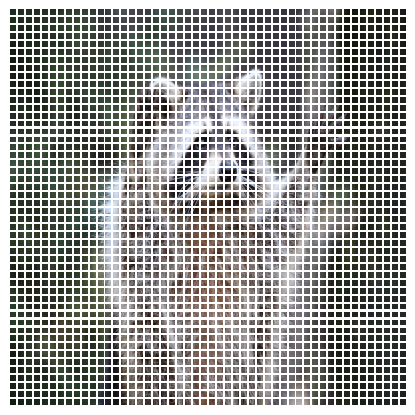

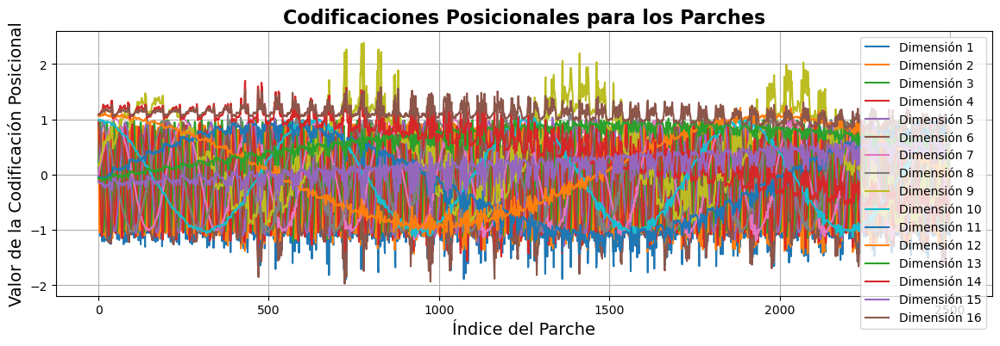

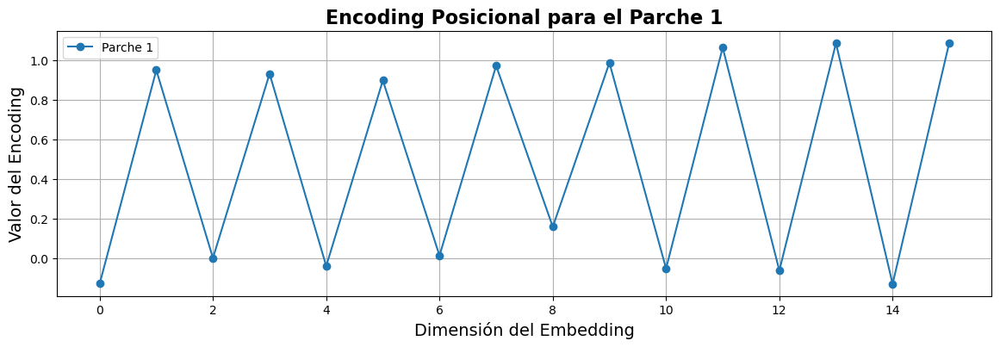

 Tiempo total: 18.9844s, Num. parches: 2500, Mem. aprox, 4.27 MB
------------------------------
Evaluando con patch_size=12, embed_dim=32
Dispositivo utilizado: cpu


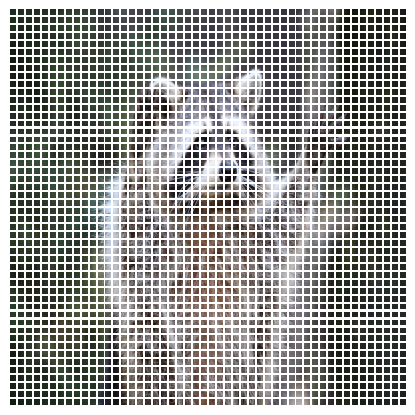

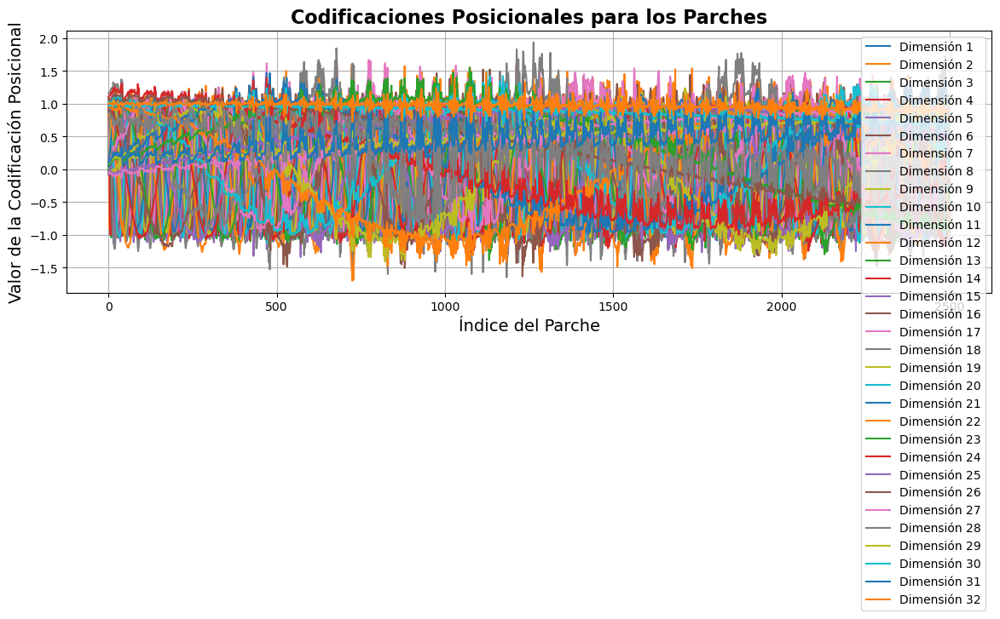

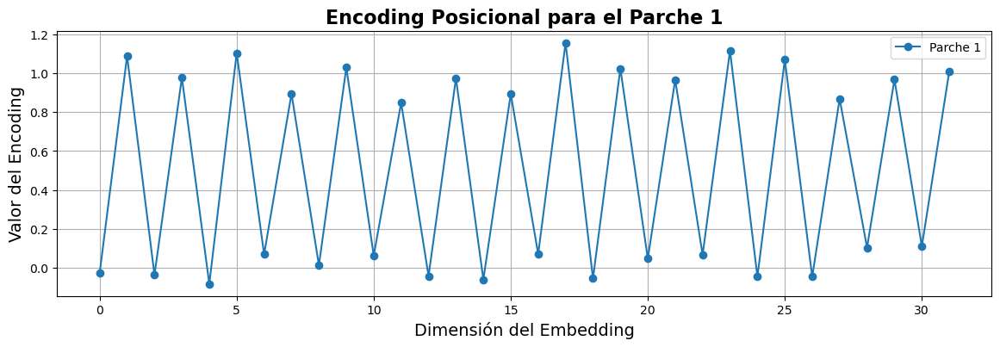

 Tiempo total: 20.9438s, Num. parches: 2500, Mem. aprox, 4.43 MB
------------------------------
Evaluando con patch_size=12, embed_dim=64
Dispositivo utilizado: cpu


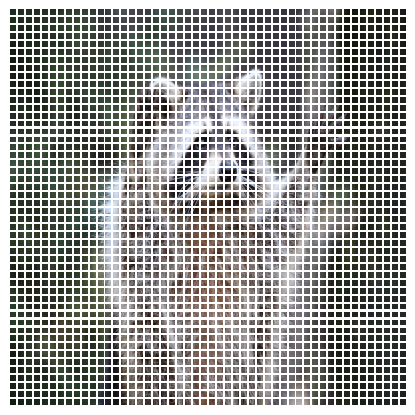

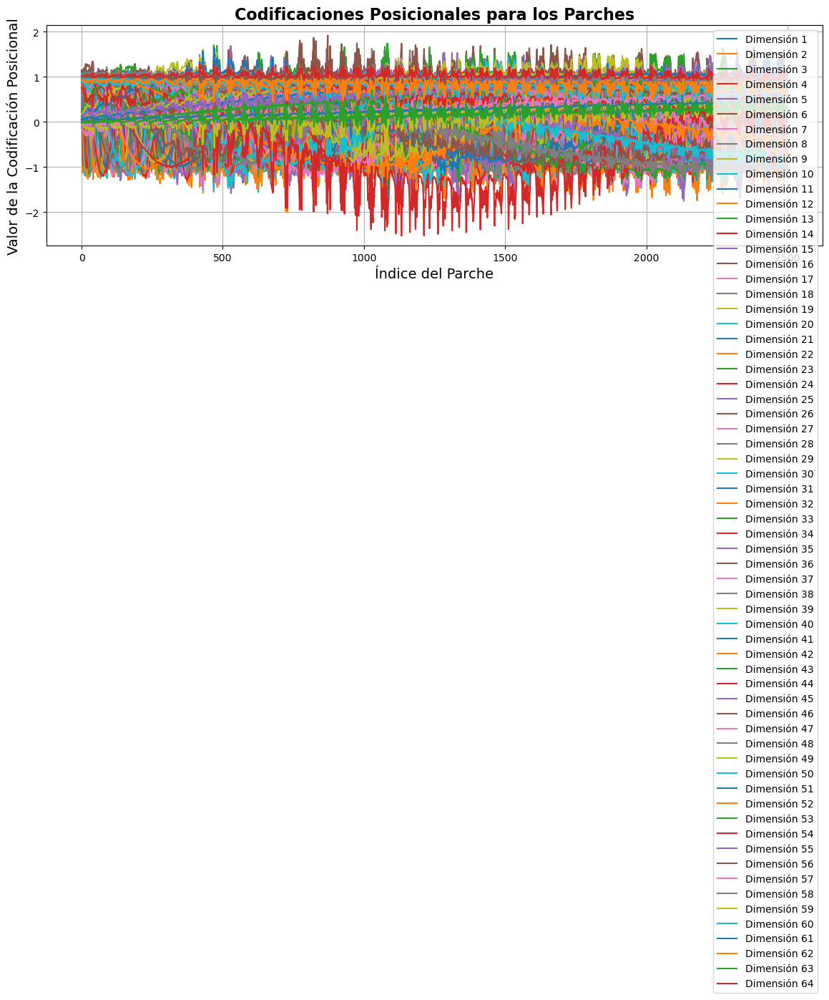

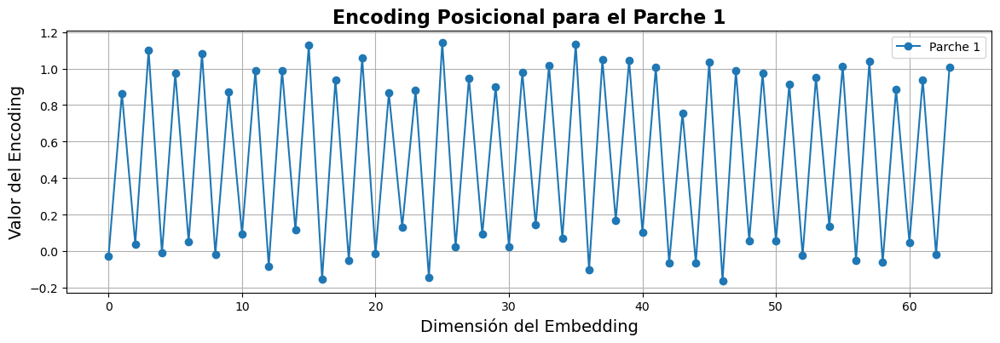

 Tiempo total: 21.9266s, Num. parches: 2500, Mem. aprox, 4.73 MB
------------------------------
Evaluando con patch_size=12, embed_dim=128
Dispositivo utilizado: cpu


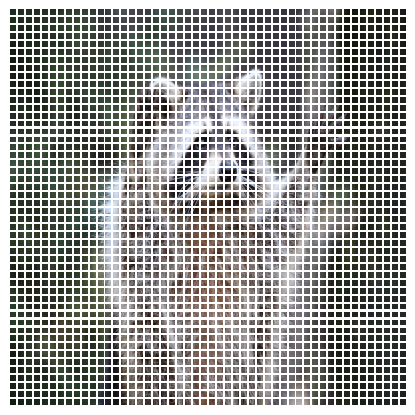

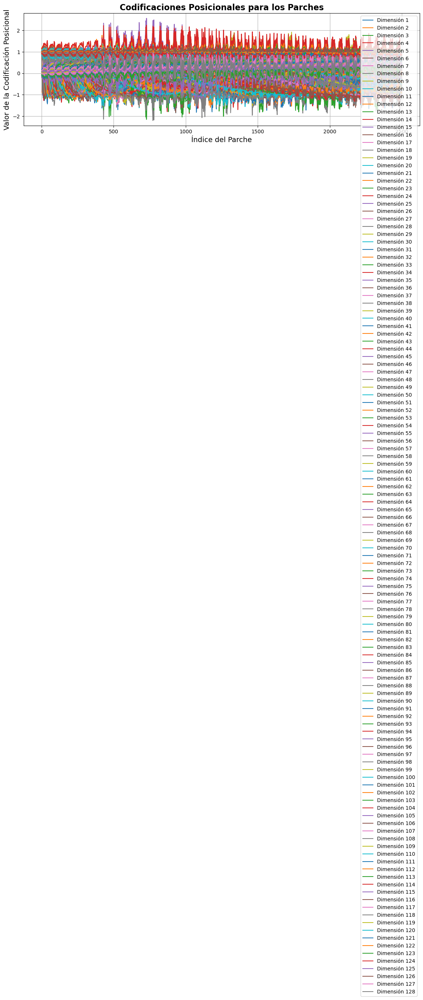

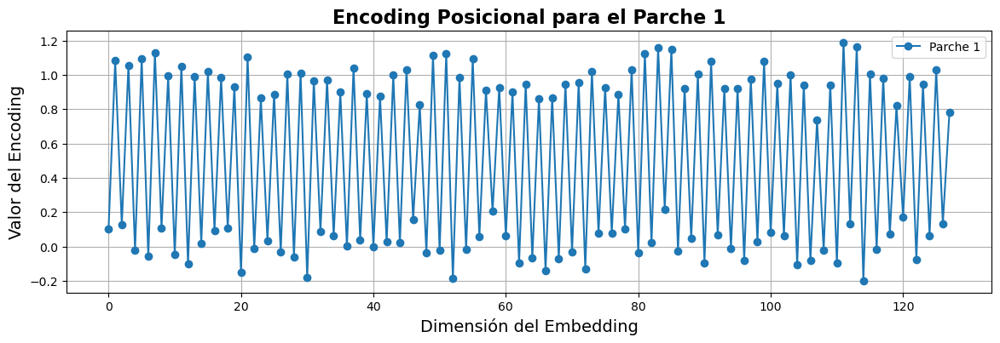

 Tiempo total: 22.2412s, Num. parches: 2500, Mem. aprox, 5.34 MB
------------------------------
Evaluando con patch_size=30, embed_dim=16
Dispositivo utilizado: cpu


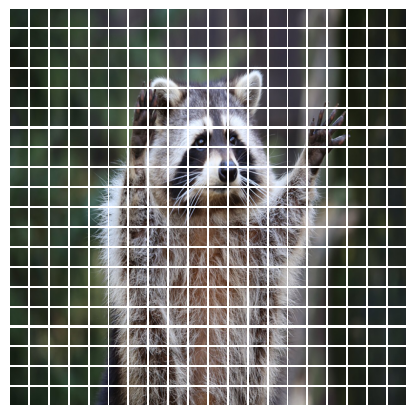

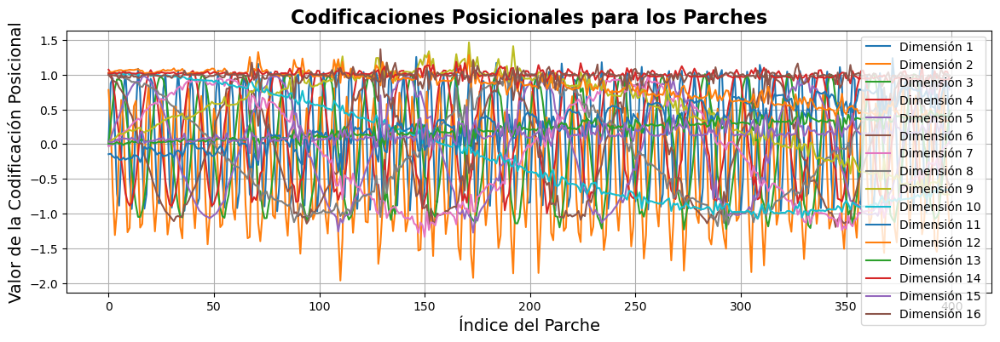

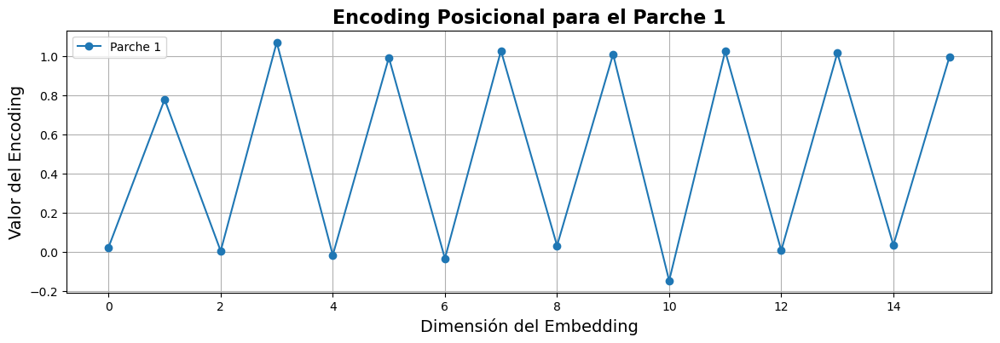

 Tiempo total: 6.0615s, Num. parches: 400, Mem. aprox, 4.14 MB
------------------------------
Evaluando con patch_size=30, embed_dim=32
Dispositivo utilizado: cpu


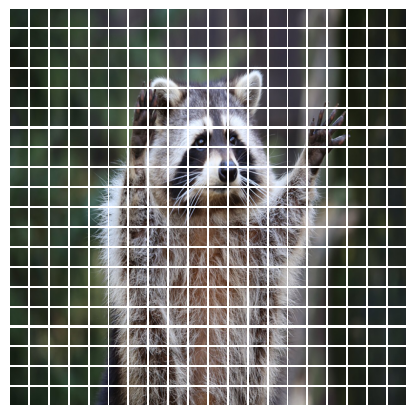

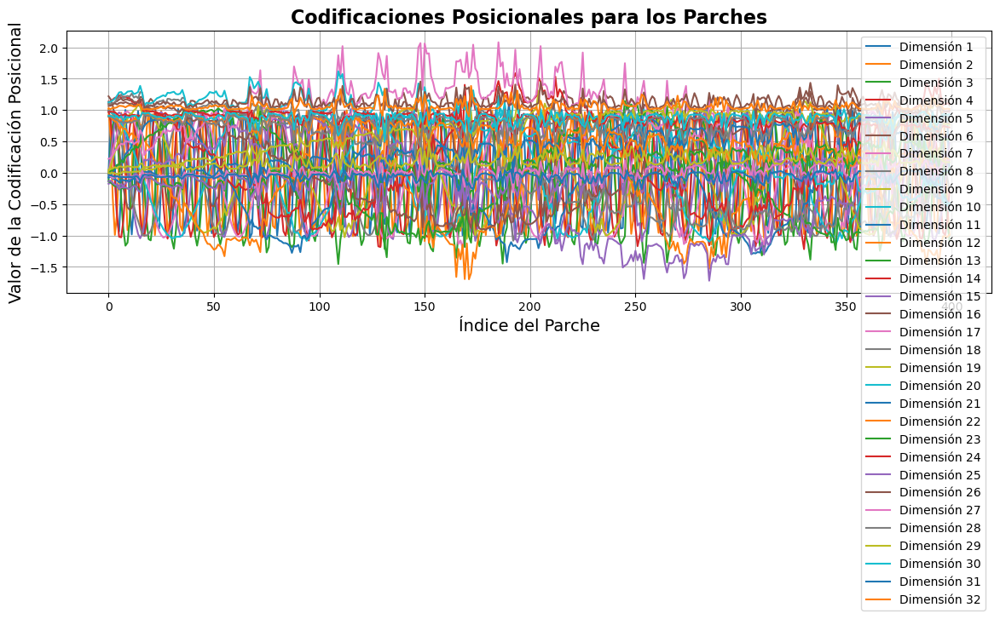

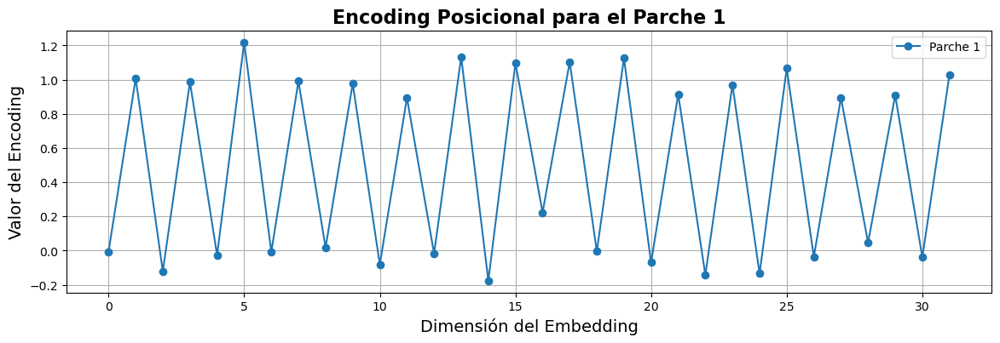

 Tiempo total: 3.6427s, Num. parches: 400, Mem. aprox, 4.17 MB
------------------------------
Evaluando con patch_size=30, embed_dim=64
Dispositivo utilizado: cpu


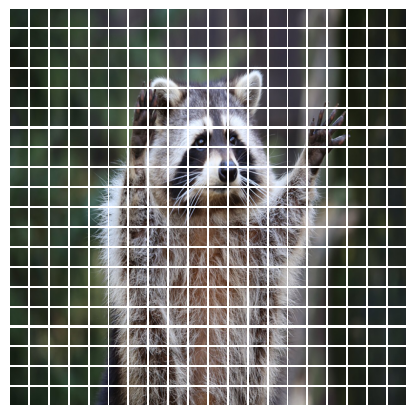

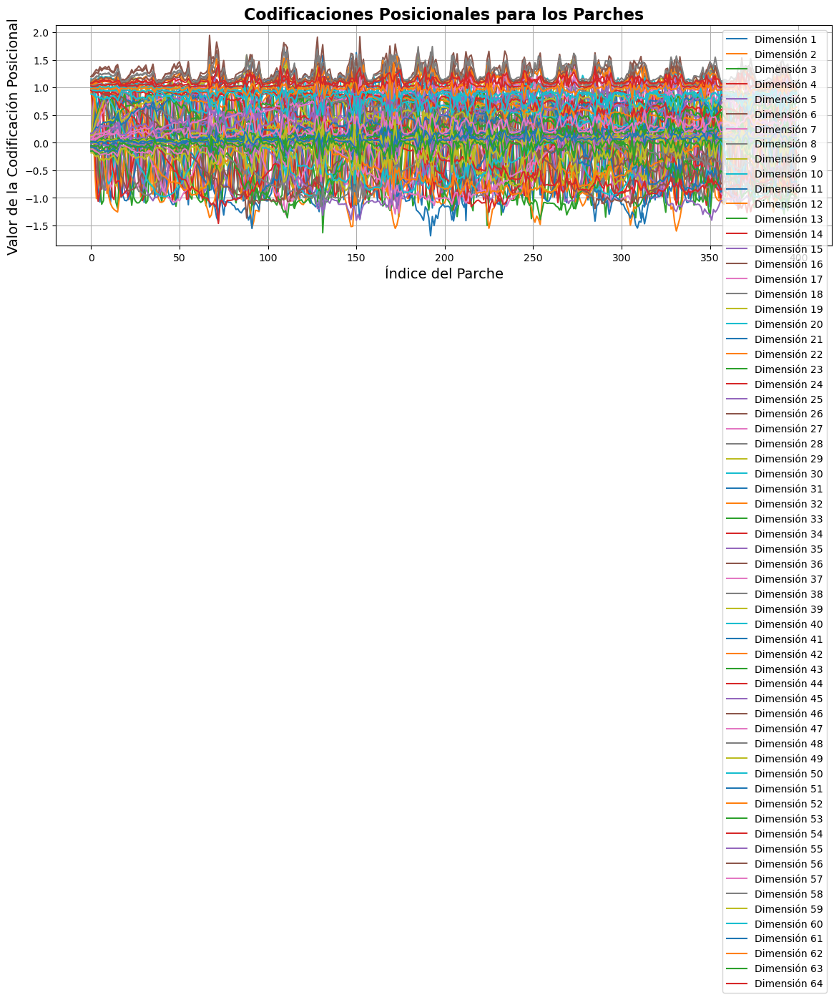

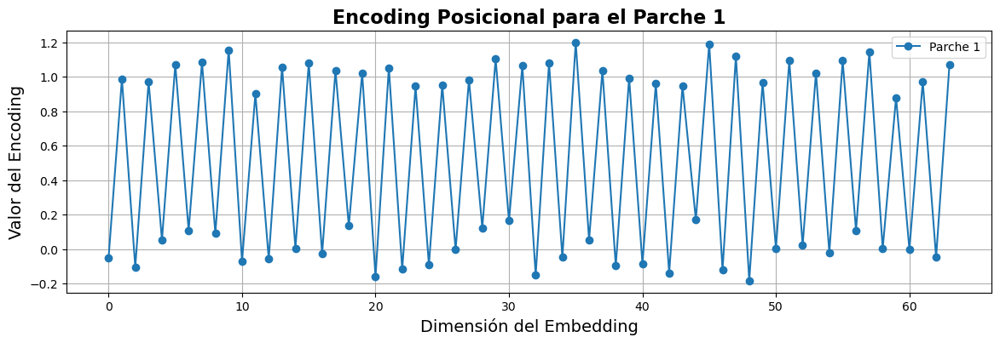

 Tiempo total: 3.8902s, Num. parches: 400, Mem. aprox, 4.22 MB
------------------------------
Evaluando con patch_size=30, embed_dim=128
Dispositivo utilizado: cpu


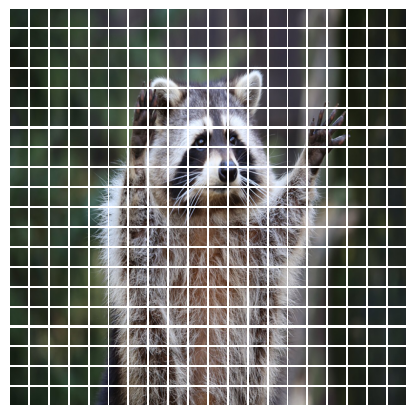

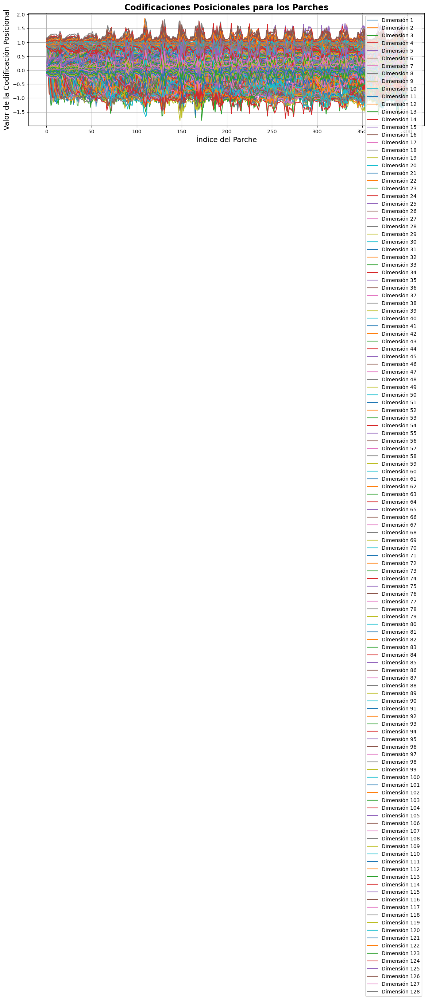

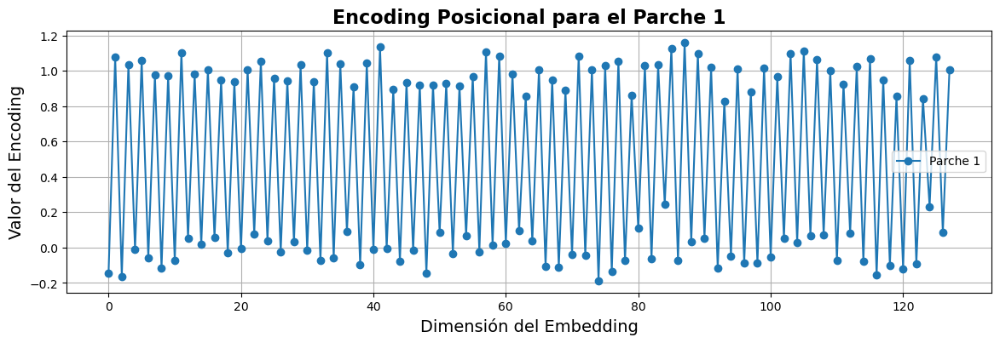

 Tiempo total: 4.1928s, Num. parches: 400, Mem. aprox, 4.32 MB
------------------------------
Evaluando con patch_size=75, embed_dim=16
Dispositivo utilizado: cpu


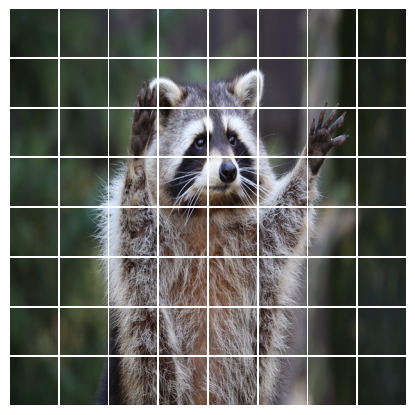

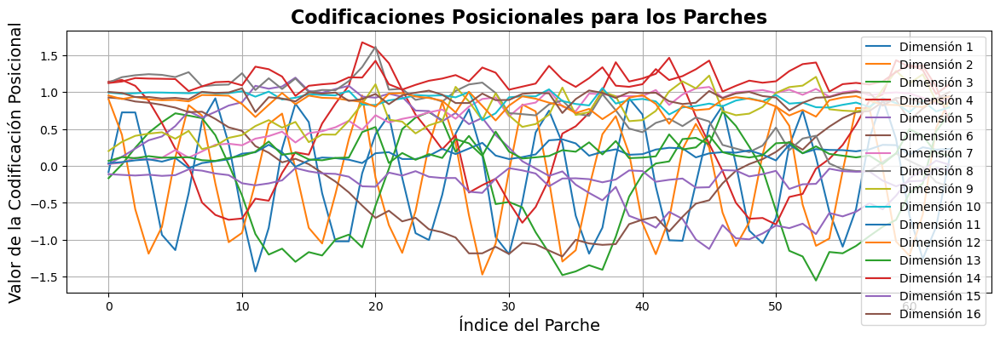

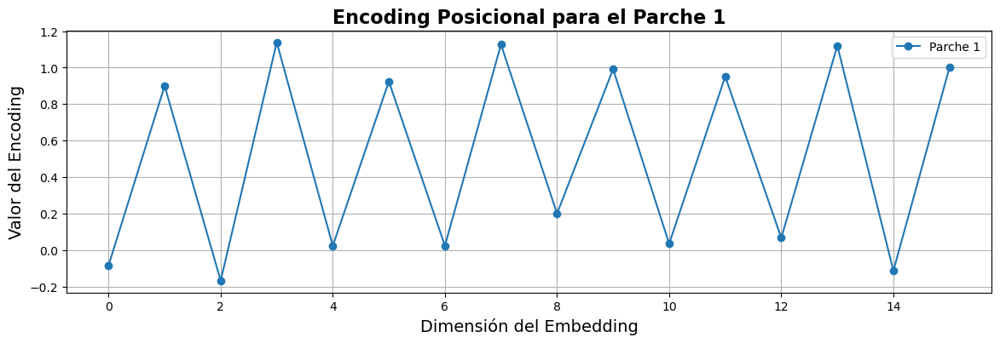

 Tiempo total: 0.7245s, Num. parches: 64, Mem. aprox, 4.12 MB
------------------------------
Evaluando con patch_size=75, embed_dim=32
Dispositivo utilizado: cpu


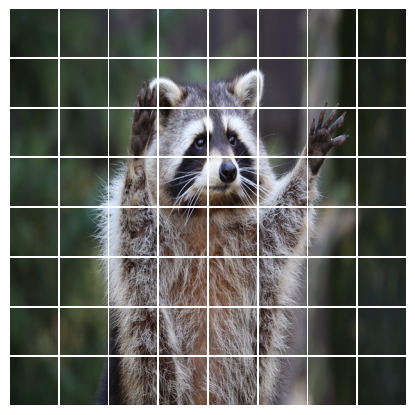

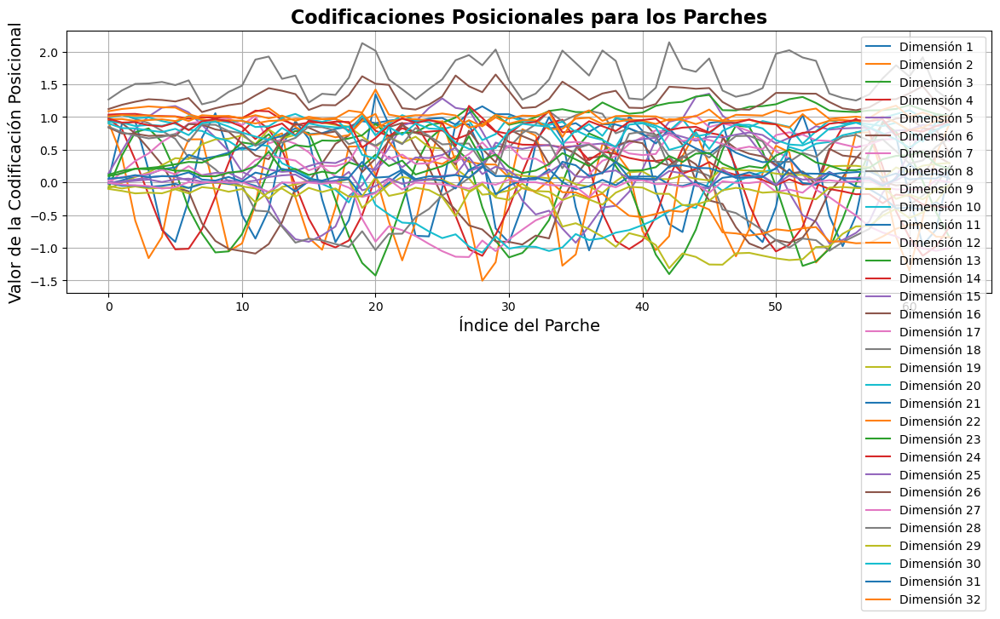

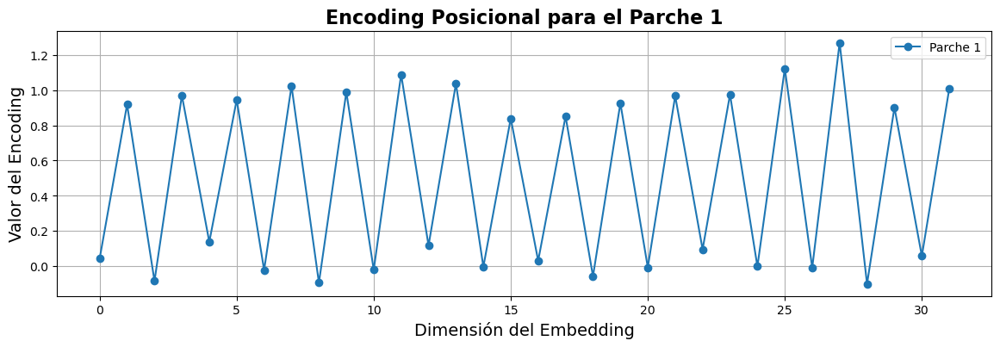

 Tiempo total: 0.7895s, Num. parches: 64, Mem. aprox, 4.13 MB
------------------------------
Evaluando con patch_size=75, embed_dim=64
Dispositivo utilizado: cpu


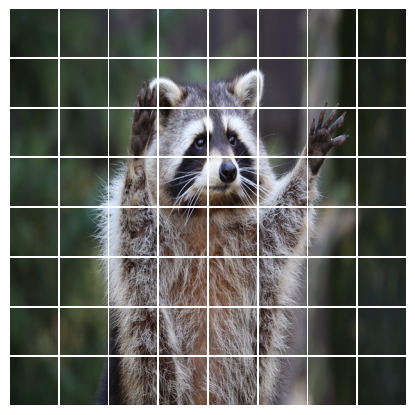

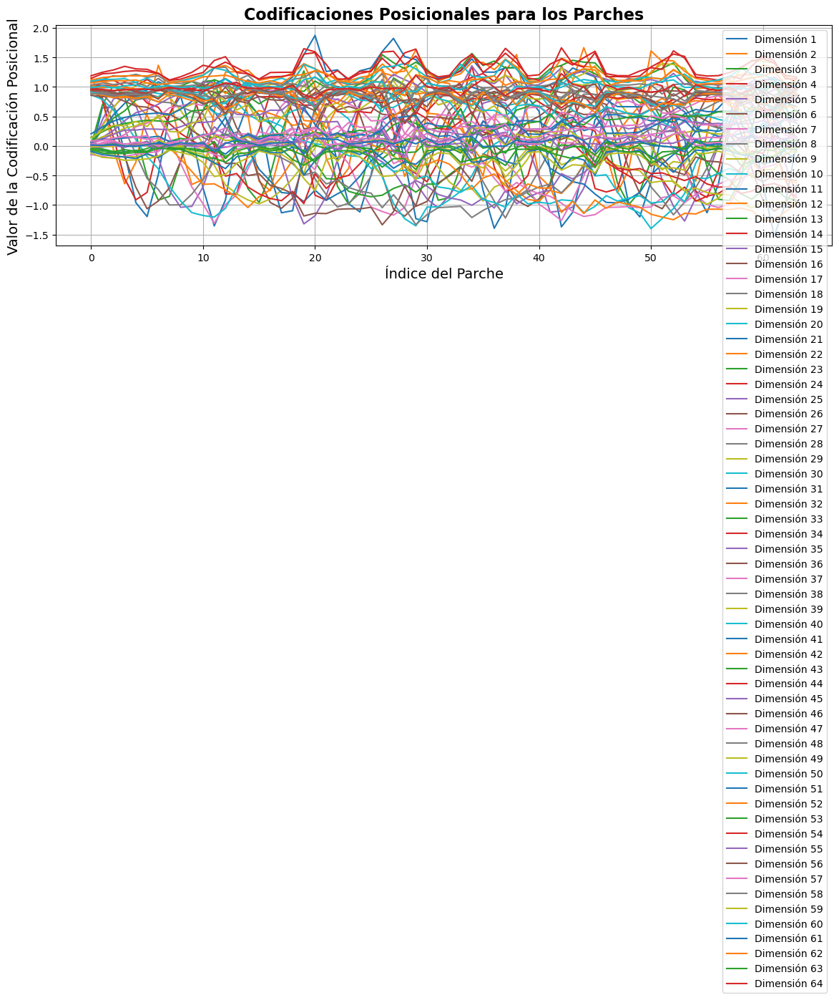

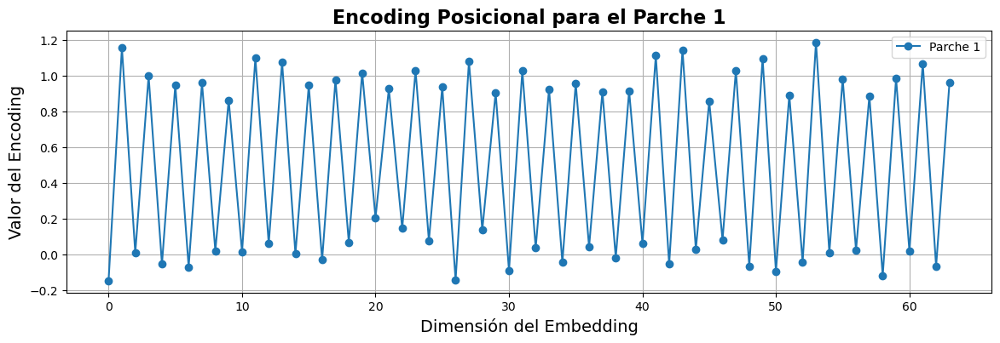

 Tiempo total: 1.6847s, Num. parches: 64, Mem. aprox, 4.14 MB
------------------------------
Evaluando con patch_size=75, embed_dim=128
Dispositivo utilizado: cpu


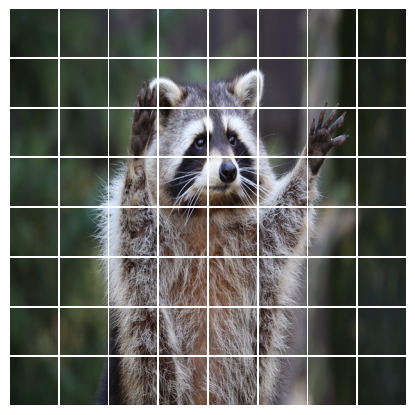

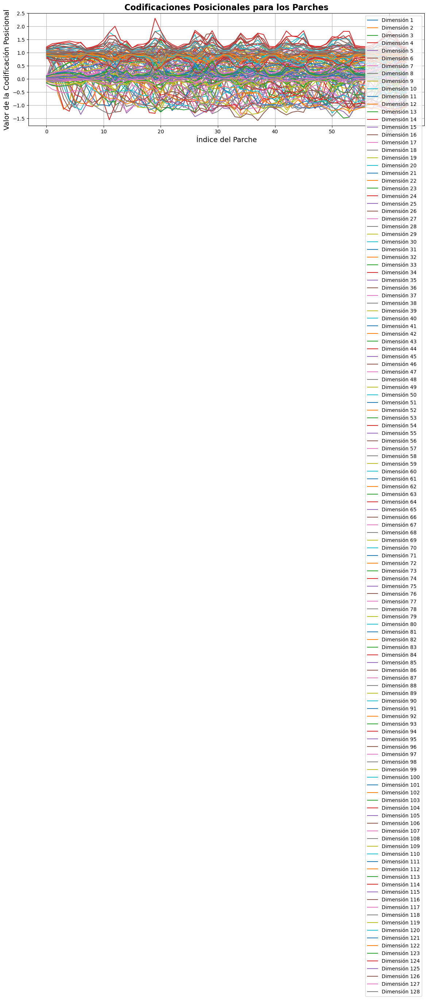

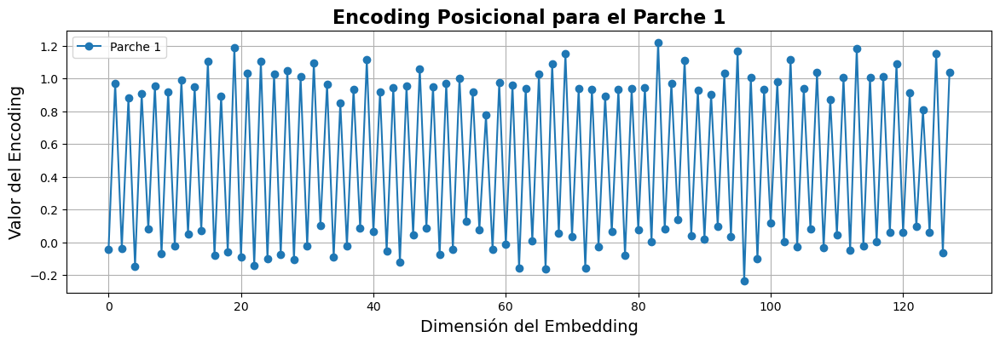

 Tiempo total: 1.3465s, Num. parches: 64, Mem. aprox, 4.15 MB
------------------------------
Evaluando con patch_size=200, embed_dim=16
Dispositivo utilizado: cpu


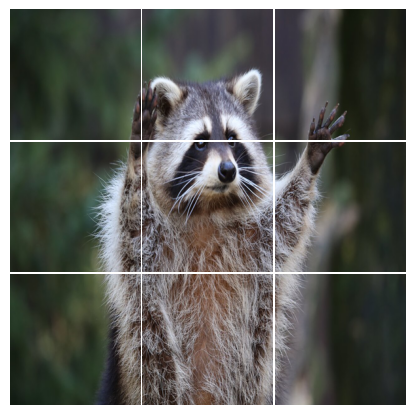

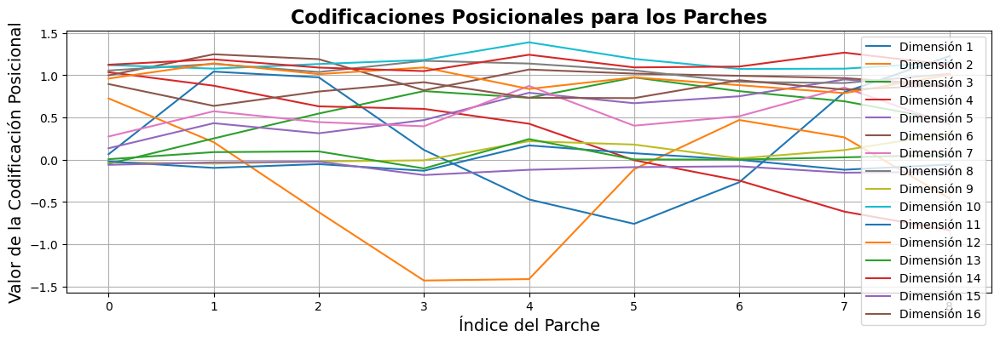

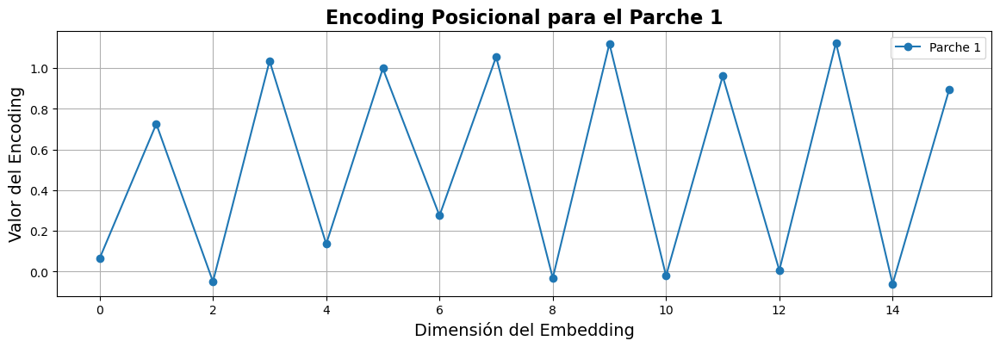

 Tiempo total: 0.4035s, Num. parches: 9, Mem. aprox, 4.12 MB
------------------------------
Evaluando con patch_size=200, embed_dim=32
Dispositivo utilizado: cpu


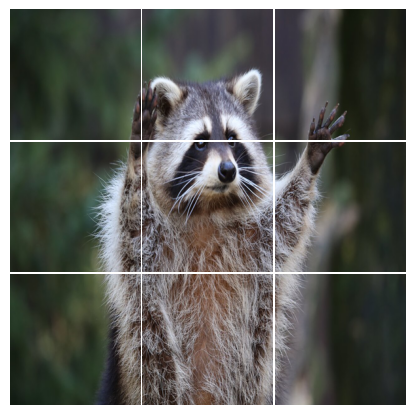

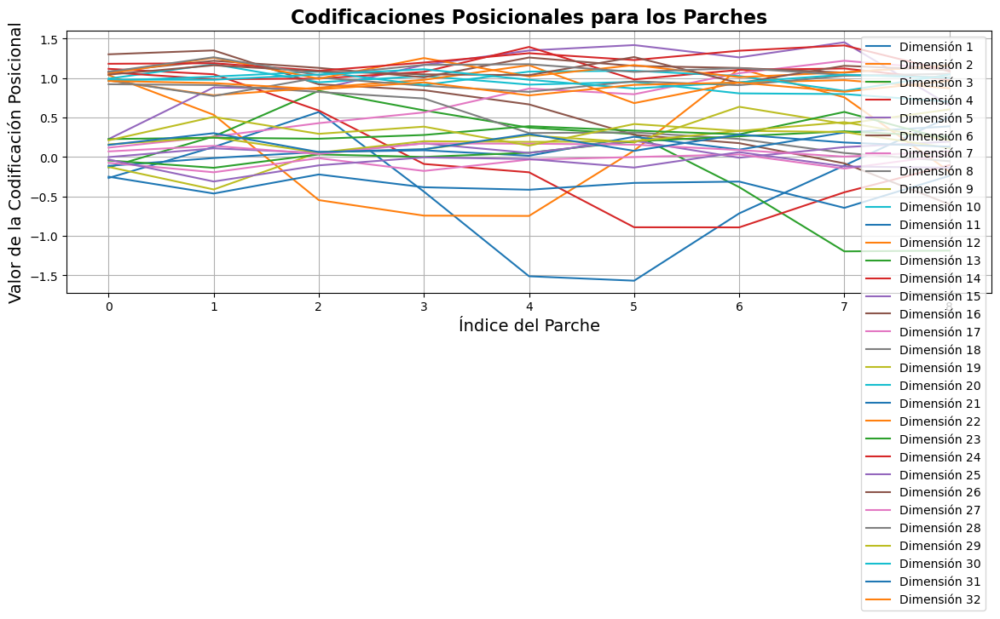

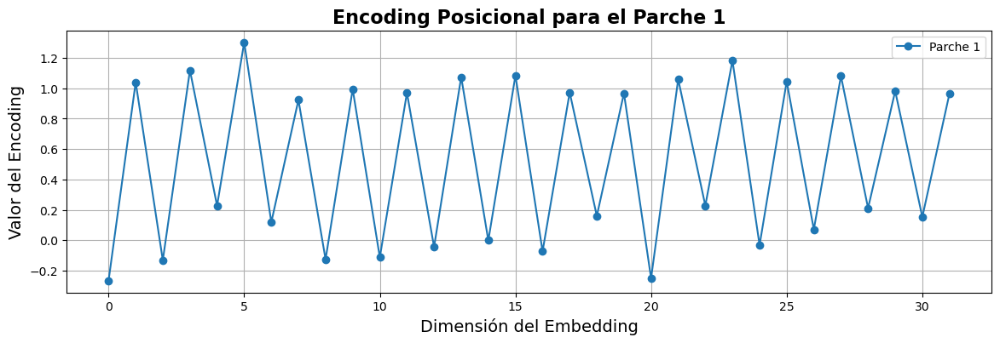

 Tiempo total: 0.4631s, Num. parches: 9, Mem. aprox, 4.12 MB
------------------------------
Evaluando con patch_size=200, embed_dim=64
Dispositivo utilizado: cpu


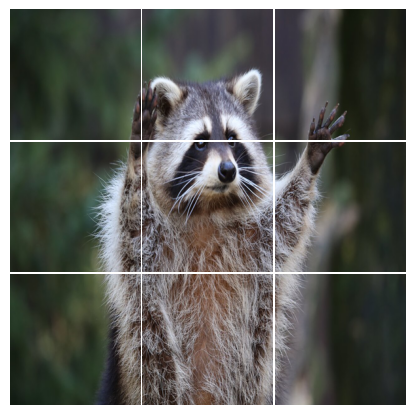

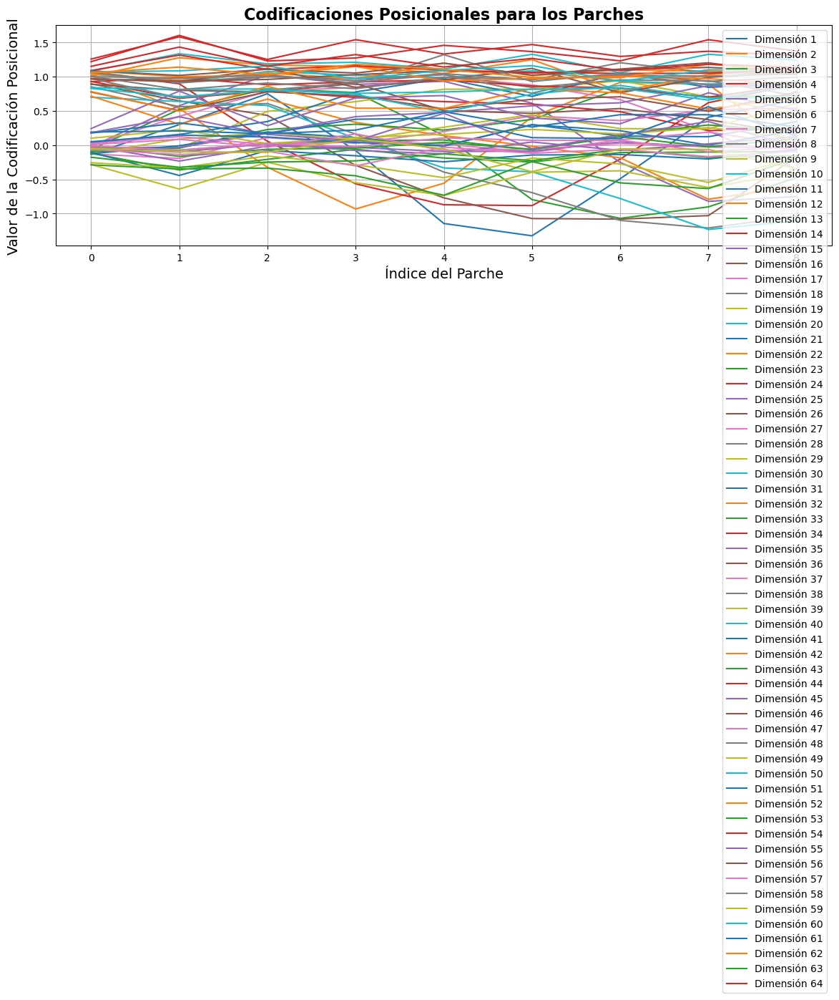

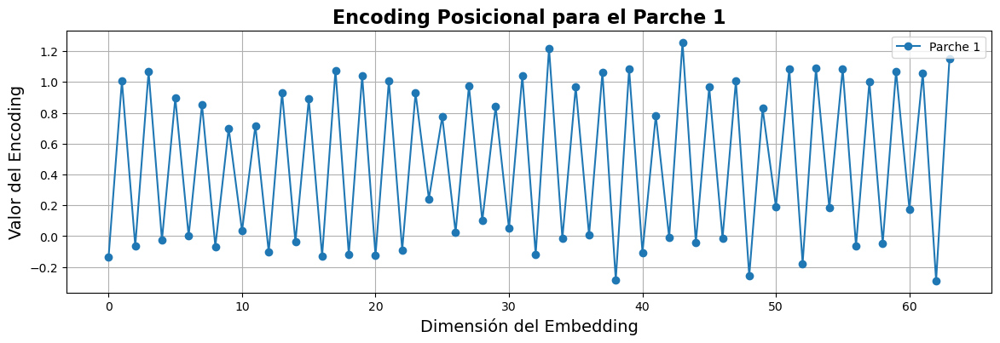

 Tiempo total: 0.6428s, Num. parches: 9, Mem. aprox, 4.12 MB
------------------------------
Evaluando con patch_size=200, embed_dim=128
Dispositivo utilizado: cpu


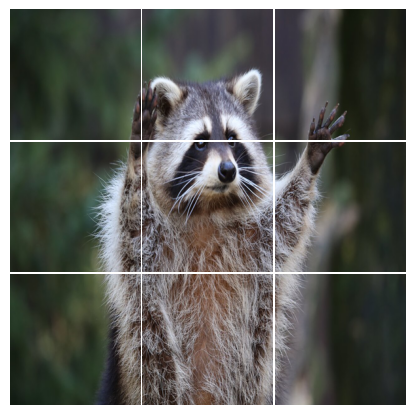

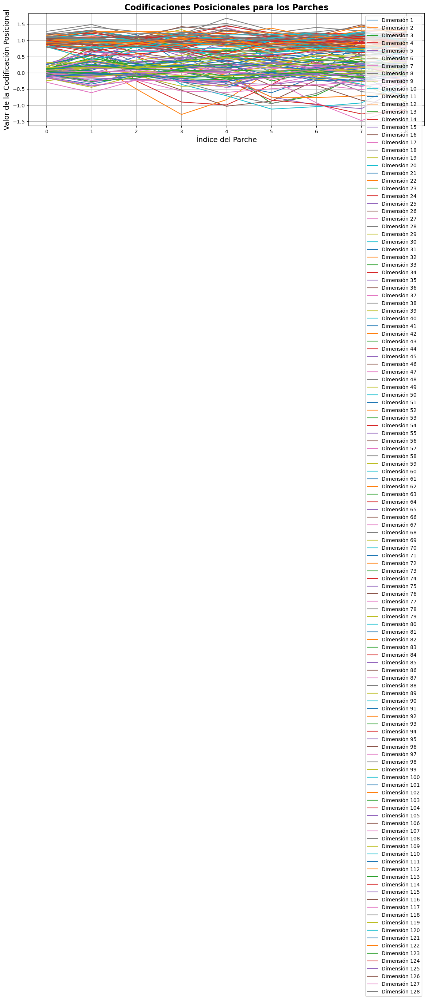

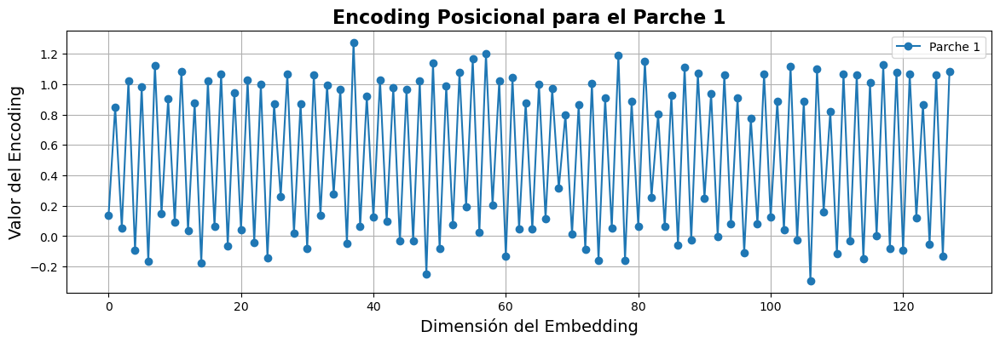

 Tiempo total: 1.1341s, Num. parches: 9, Mem. aprox, 4.12 MB
------------------------------


In [24]:
for patch_size in patch_sizes:
    for embed_dim in embed_dims:
        # Verificamos que el tamaño del parche sea válido (divisor de img_size)
        if img_size % patch_size != 0:
            print(f"Saltando patch_size={patch_size} (no es divisor de img_size={img_size})")
            continue

        print(f"Evaluando con patch_size={patch_size}, embed_dim={embed_dim}")
        resultado, _ = run_vit(
            img_path,
            img_size,
            patch_size,
            embed_dim,
            pos_encoding_type="sinusoidal",
            visualizar=True,
        )
        resultados.append(resultado)
        num_patches = resultado['num_patches']
        print(f" Tiempo total: {resultado['total']:.4f}s, Num. parches: {num_patches}, Mem. aprox, {resultado['memoria_total_mb']:.2f} MB")
        print("-" * 30)

#### Analisis de resultados

In [25]:
# Gurdar resultados en un DataFrame
df_resultados = pd.DataFrame(resultados)
print(f"\nResultados:")
print(df_resultados[['patch_size', 'embed_dim', 'num_patches', 'total', 'memoria_total_mb']])


Resultados:
    patch_size  embed_dim  num_patches      total  memoria_total_mb
0           12         16         2500  18.984388          4.272461
1           12         32         2500  20.943787          4.425049
2           12         64         2500  21.926590          4.730225
3           12        128         2500  22.241223          5.340576
4           30         16          400   6.061529          4.144287
5           30         32          400   3.642656          4.168701
6           30         64          400   3.890229          4.217529
7           30        128          400   4.192775          4.315186
8           75         16           64   0.724535          4.123779
9           75         32           64   0.789497          4.127686
10          75         64           64   1.684717          4.135498
11          75        128           64   1.346496          4.151123
12         200         16            9   0.403457          4.120422
13         200         32          

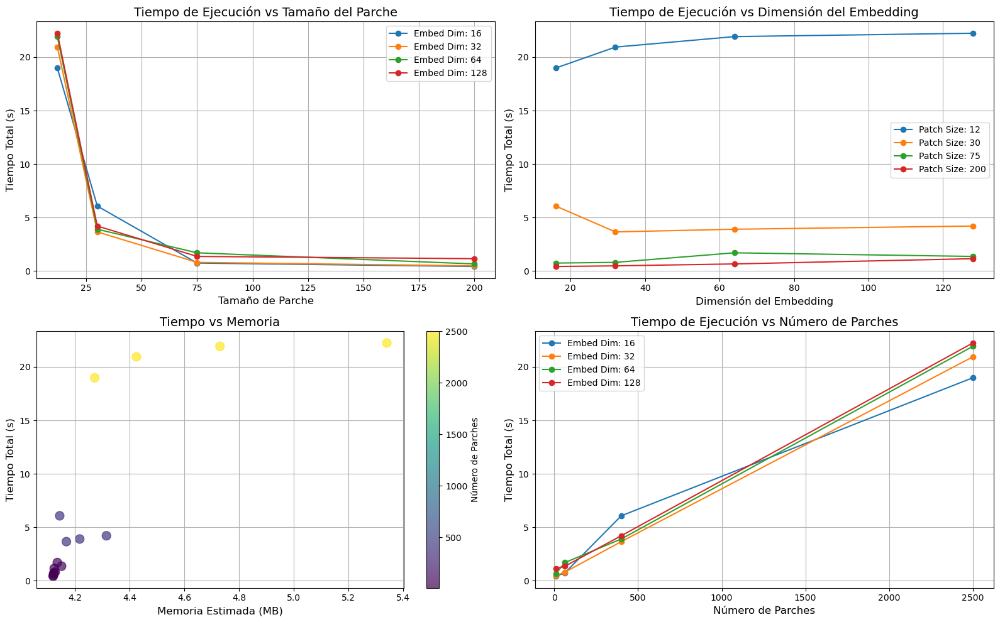


Resultados  en 'graficos.png'


In [26]:
# Visualización de resultados con nuevo orden de gráficos
plt.figure(figsize=(16, 10))

plt.subplot(2, 2, 1)
for embed_dim in embed_dims:
    datos = df_resultados[df_resultados['embed_dim'] == embed_dim]
    if not datos.empty:
        plt.plot(datos['patch_size'], datos['total'], 'o-', label=f'Embed Dim: {embed_dim}')
plt.xlabel('Tamaño de Parche', fontsize=12)
plt.ylabel('Tiempo Total (s)', fontsize=12)
plt.title('Tiempo de Ejecución vs Tamaño del Parche', fontsize=14)
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 2)
for patch_size in patch_sizes:
    datos = df_resultados[df_resultados['patch_size'] == patch_size]
    if not datos.empty:
        plt.plot(datos['embed_dim'], datos['total'], 'o-', label=f'Patch Size: {patch_size}')
plt.xlabel('Dimensión del Embedding', fontsize=12)
plt.ylabel('Tiempo Total (s)', fontsize=12)
plt.title('Tiempo de Ejecución vs Dimensión del Embedding', fontsize=14)
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 3)
scatter = plt.scatter(df_resultados['memoria_total_mb'], df_resultados['total'], 
                     c=df_resultados['num_patches'], cmap='viridis', s=100, alpha=0.7)
plt.colorbar(scatter, label='Número de Parches')
plt.xlabel('Memoria Estimada (MB)', fontsize=12)
plt.ylabel('Tiempo Total (s)', fontsize=12)
plt.title('Tiempo vs Memoria', fontsize=14)
plt.grid(True)

plt.subplot(2, 2, 4)
for embed_dim in embed_dims:
    datos = df_resultados[df_resultados['embed_dim'] == embed_dim]
    if not datos.empty:
        plt.plot(datos['num_patches'], datos['total'], 'o-', label=f'Embed Dim: {embed_dim}')
plt.xlabel('Número de Parches', fontsize=12)
plt.ylabel('Tiempo Total (s)', fontsize=12)
plt.title('Tiempo de Ejecución vs Número de Parches', fontsize=14)
plt.legend()
plt.grid(True)



plt.tight_layout()
plt.savefig(FIGURES_DIR + "/graficos.png")
plt.show()

print("\nResultados  en 'graficos.png'")

#### Análisis de los distintos ajustoes:

1. Tamaño de parche:

    - 12x12

        * Pros: son capaces de identificar detalles mas especificos de la imagen porque abarcan menor area por parche.

        * Contras: mucho mayor costo computacional y tiempo de ejecucion en consecuencia.

    - 30x30 / 75x75

        * Pros: son mas eficientes y proporcionan un punto medio entre precision y tiempo de computo.

        * Contras: potencialmente hay lugar para mejora en captura de detalles/evitar sobreajuste.
        
    - 200x200

        * Pros: menor tiempo de computo de todos los ordenes observados

        * Contras: riesgo de bias, no se capturan detalles especificos como en parches mas pequeños.


2. Dimensiones embedding:

    - embed_dim=16 

        * Pros: más eficientes, menor riesgo de sobreajuste y más fáciles de interpretar.

        * Contras: capacidad de representación limitada y posible pérdida de información.
        
    - embed_dim=128

        * Pros: mayor capacidad de representación y expresividad del modelo.

        * Contras: mayor coste computacional, uso de memoria y riesgo de sobreajuste.


3. Otros puntos relevantes:

    - **Relación entre número de parches y memoria:** El número de parches (`num_patches`) impacta directamente en el uso de memoria y el tiempo de cómputo. Por ejemplo, con `patch_size=12` se generan 2500 parches, lo que incrementa significativamente el costo computacional y la memoria requerida, especialmente con dimensiones de embedding altas.

    - **Escalabilidad:** A medida que se incrementa la dimensión del embedding (`embed_dim`), el uso de memoria crece linealmente. Esto puede ser un factor limitante en hardware con recursos restringidos.
    
    - **Efecto en la generalización:** Embeddings de mayor dimensión pueden capturar patrones más complejos, pero también incrementan el riesgo de sobreajuste si el dataset no es suficientemente grande.

    - **Velocidad de inferencia:** Parches más grandes y embeddings más pequeños permiten una inferencia mucho más rápida, útil en aplicaciones en tiempo real o dispositivos con baja capacidad de procesamiento.

    - **Compatibilidad con arquitecturas:** Algunos tamaños de parche pueden ser más adecuados para ciertas arquitecturas de Vision Transformer, dependiendo de la resolución de entrada y la profundidad del modelo.

    - **Visualización y análisis:** Los gráficos generados permiten observar claramente cómo el tiempo de ejecución y el uso de memoria aumentan con menor tamaño de parche y mayor dimensión de embedding.

4. Conclusiones:

     Tanto el tamaño del parche como la dimensión del embedding son hiperparámetros fundamentales que afectan directamente el balance entre:
     * La capacidad de representación del modelo y la eficiencia computacional.
     * El nivel de detalle capturado frente a la velocidad de procesamiento.
     * La precisión en tareas específicas y la capacidad de generalización.


### 2. **Implementar embedding posicional aprendido 1D:** Partiendo de ejemplo proporcionado (codificación sinusoidal en clase PositionalEncoding), implementar una clase PositionalEncodingLearned que utilice PyTorch y genere embebidos posicionales aprendidos. Graficar.

Comparando encodings posicionales para patch_size=30, embed_dim=16
Dispositivo utilizado: cpu


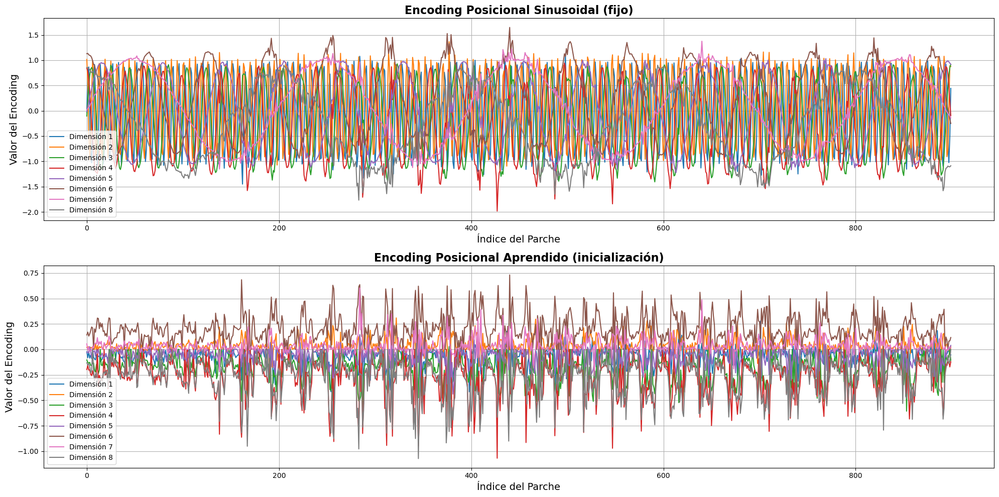

Comparación guardada en 'comparacion_encodings_p30_e16.png'
Dispositivo utilizado: cpu


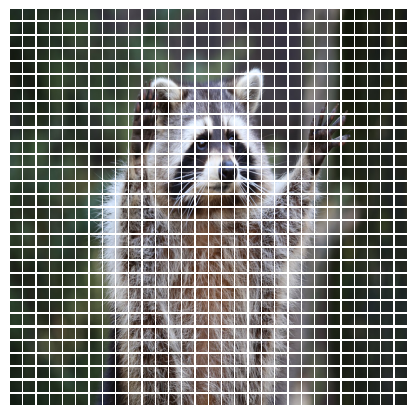

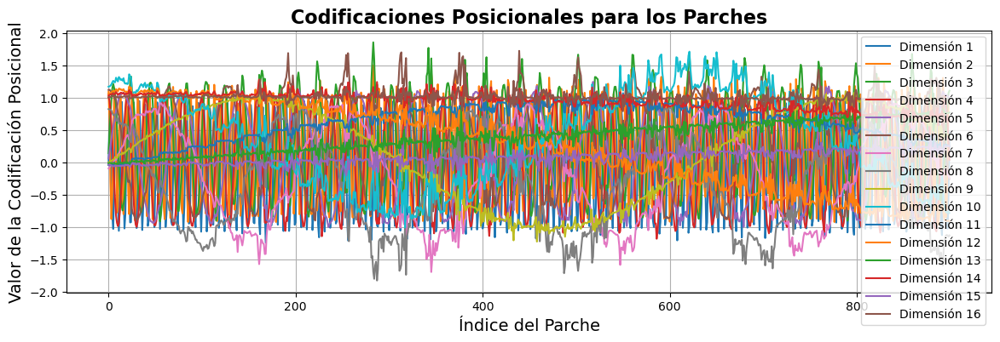

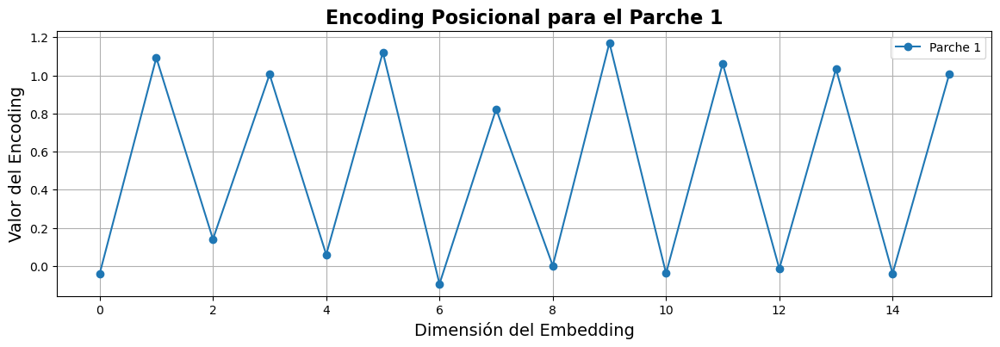

Dispositivo utilizado: cpu


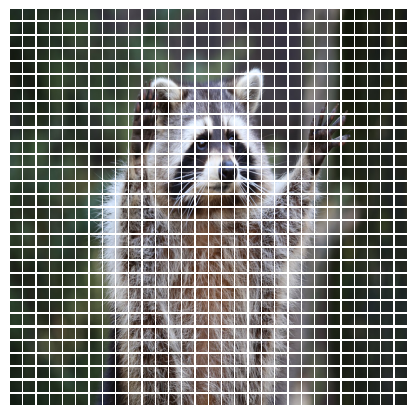

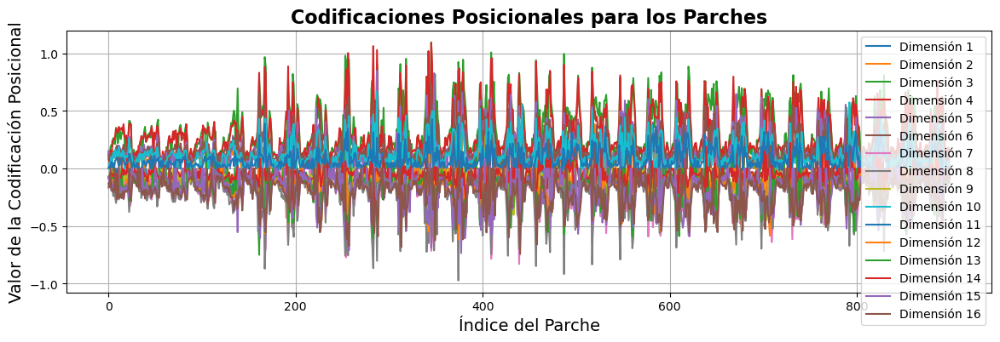

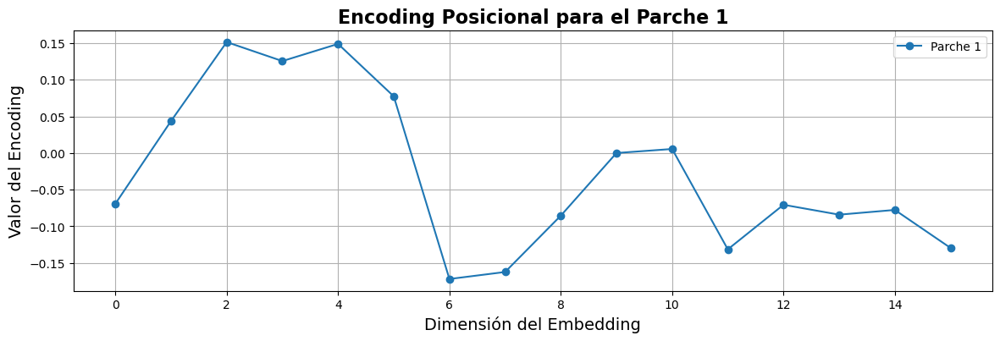


Tiempo total (Sinusoidal): 7.3910s
Tiempo total (Aprendido): 7.6141s
Diferencia: 0.2232s


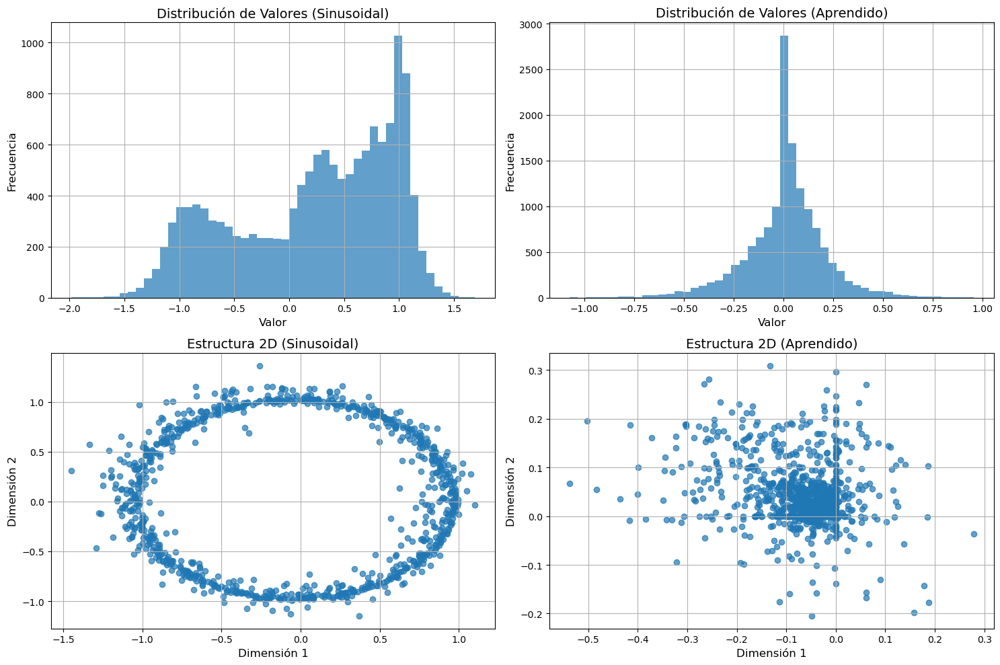


comparacion_encodings.png saved.


In [27]:
#ejecutamos la funcion de comparacion de encodings con patch_size=60 y embed_dim=16

run_encoding_types(img_path, FIGURES_DIR)

#### Análisis de Resultados

##### 1. Diferencias entre Tipos de Encoding Posicional

**Encoding Sinusoidal (Fijo)**
- Utiliza funciones periódicas con frecuencias escalonadas para cada dimensión.
- Ofrece una codificación determinista y repetible que preserva relaciones espaciales coherentes.
- Su salida se extiende en un rango amplio (-1.5 a 1.5) y presenta una distribución bimodal distintiva.

**Encoding Aprendido (Inicial sin Entrenamiento)**
- Parte de una representación sin estructura ni regularidad, ya que aún no ha sido optimizada.
- Se inicializa mediante una distribución normal estrecha (desvío estándar de 0.02), centrada en cero.
- Su activación se concentra en un rango reducido (-0.5 a 1.0) y tiende hacia una forma gaussiana.

##### 2. Visualización en Dos Dimensiones

- **Sinusoidal**: forma patrones geométricos organizados, similares a curvas espirales o estructuras radiales.
- **Aprendido**: muestra una nube de puntos desordenada y centrada, sin una geometría clara.

##### 3. Fortalezas y Debilidades

**Sinusoidal**

*Pros:*
- Funciona sin requerir fase de entrenamiento.
- Generaliza bien a secuencias más largas que las vistas durante el ajuste.
- No incorpora parámetros adicionales al modelo.
- Las relaciones posicionales están garantizadas por su construcción matemática.

*Contras:*
- No puede adaptarse a patrones específicos de los datos.
- Las frecuencias usadas podrían no ser ideales para todas las tareas.

**Aprendido**

*Pros:*
- Puede especializarse y ajustarse a la distribución de los datos durante el entrenamiento.
- Potencial para mejorar el rendimiento en tareas concretas.
- Flexibilidad para construir codificaciones más adecuadas según el contexto.

*Contras:*
- Necesita entrenamiento para ser efectivo.
- Aumenta la complejidad del modelo y el riesgo de sobreajuste.
- Tiene menor capacidad de generalización fuera del dominio visto.

##### 4. Sintetizando:

- **Encoding Sinusoidal:**
  - Se requiere adaptabilidad a secuencias de longitud variable.
  - Es importante la transparencia e interpretabilidad del modelo.
  - Se desea reducir la cantidad de parámetros.

- **Encoding Aprendido:**
  - Las entradas tienen longitud fija (caso común en Vision Transformers).
  - Se busca optimizar el rendimiento en una tarea bien definida.
  - Se cuenta con datos de entrenamiento suficientes.

##### Conclusión

La comparación evidencia diferencias clave: el encoding sinusoidal proporciona una estructura inmediata y predecible útil desde el inicio, mientras que el encoding aprendido comienza sin forma, pero puede evolucionar hacia representaciones especializadas más eficaces tras el entrenamiento.
```
